In [324]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from pandas.api.types import CategoricalDtype
%matplotlib inline

path="http://archive.ics.uci.edu/ml/machine-learning-databases/" 
dataSet="adult/adult.data" 
inFile=path+dataSet 
x=pd.read_csv(inFile,header=None) 

In [325]:
df=pd.DataFrame(x,index=None) 
df= df.rename(columns={0:'age',1: 'workclass', 
2:'fnlwgt',3:'education',4:'education-num', 
5:'marital-status',6:'occupation',7:'relationship', 
8:'race',9:'sex',10:'capital-gain',11:'capital-loss', 
12:'hours-per-week',13:'native-country',14:'label'}) 

df.to_pickle("C:/Users/Ngoc Dao/Google Drive/TnT/578 Data Visualization/Project/adult.pkl") 
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,label
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [326]:
cat=['workclass','education','marital-status','occupation','relationship','race','sex','native-country']
for i in cat:
    df[i] = df[i].str.lstrip()
    df[i] = df[i].str.rstrip()
    df[i]=df[i].astype('category')
    
df['class']=df['label'].astype('category').cat.codes
df['capital']=df['capital-gain']-df['capital-loss']

x1=df[df['class']==1]
x0=df[df['class']==0]
x1.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,label,class,capital
7,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K,1,0
8,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K,1,14084
9,42,Private,159449,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178,0,40,United-States,>50K,1,5178
10,37,Private,280464,Some-college,10,Married-civ-spouse,Exec-managerial,Husband,Black,Male,0,0,80,United-States,>50K,1,0
11,30,State-gov,141297,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,Asian-Pac-Islander,Male,0,0,40,India,>50K,1,0


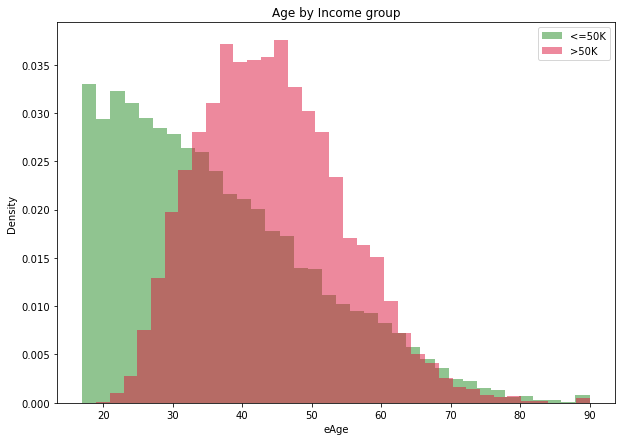

In [239]:
# Age comparision

kwargs = dict(alpha=0.5, bins=36, density=True,stacked=True)
plt.figure(figsize=(10,7))

plt.hist(x0['age'],color='forestgreen',label='<=50K', **kwargs)
plt.hist(x1['age'],color='crimson',label='>50K', **kwargs)

plt.title('Age by Income group')
plt.xlabel("eAge")
plt.ylabel('Density')
plt.legend()
plt.show()

In [210]:
px.histogram(df, x='age', color='label', histnorm='probability density', marginal='box')


In [270]:
#Education variable:
# Re-order education level in categorical variable. 
# The original values will be mix up when we plot data on graph.

# Order of education level
edu=['Doctorate','Masters','Assoc-acdm','Bachelors','Some-college','Assoc-voc',
     'Prof-school', 'HS-grad','12th','11th','10th','9th','7th-8th',
     '5th-6th','1st-4th','Preschool']
# Eliminate all space in begining or end of education value
df['education'] = df['education'].str.lstrip()
df['education'] = df['education'].str.rstrip()

#Set education variable as Catergory
cat_type=CategoricalDtype(categories=edu, ordered=True)
df['education'] = df['education'].astype(cat_type)

# Plot data of education by Income group using violin graph
px.violin(df,y='education', color='label',box=True,
          category_orders = {'education': edu})


In [292]:
# Hours per week -Histogram
# We use histogram combine with boxplot. However, histogram does not perform well with outliers.
px.histogram(df,x='hours-per-week', color='label',
             nbins=20, histnorm='probability density', marginal='box')


<ipython-input-314-0149de4bac48>:23: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



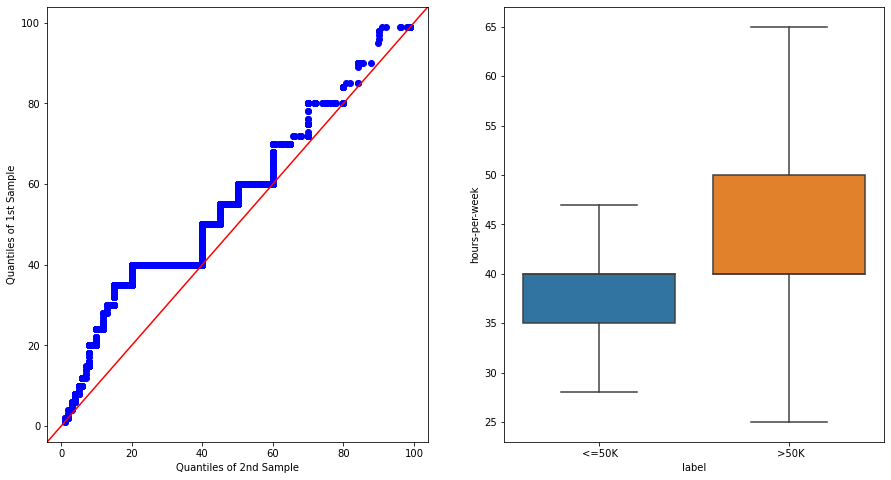

In [314]:
#Hours per week - QQplot
# We will try with QQplot to compare to 2 subsamples: >50K and <=50K.


import statsmodels.api as sm
from statsmodels.graphics.gofplots import qqplot_2samples
x = x0['hours-per-week']
y = x1['hours-per-week']
pp_x = sm.ProbPlot(x)
pp_y = sm.ProbPlot(y)
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(15,8))

# First subplot: QQplot to compare distribution of 2 subsamples
qqplot_2samples(pp_x,pp_y, line='45',ax=axes[0])

# Second subplot: Boxplot 
sns.boxplot(data=df,y='hours-per-week',x='label', showfliers=False, ax=axes[1])
#sns.swarmplot(data=df, y='hours-per-week', x='label', color='.25', ax=axes[1])
#sns.violinplot(data=df,x='sex',y='hours-per-week',hue='label', split=True, inner='quartile', ax=axes[1])


fig.show()


In [350]:
# Parallel categories
#White race is dominant group in data. To visualize data insightful, we separate data to 2 subgroups
# White race and non-white races.
from plotly.subplots import make_subplots
df1=df[df['race'] != 'White']
df2=df[df['race'] =='White']

dim=['race','sex','marital-status']

fig= make_subplots(rows=2, cols=1)
fig.add_trace(px.parallel_categories(df1, color='class', dimensions=dim), rows=1, cols=1)
fig.add_trace(px.parallel_categories(df2, color='class', dimensions=dim),rows=2, cols=1)
#fig.update_layout(height=600, width=800, title_text="Parallel categories for White and Non-White")
fig.show()

TypeError: add_trace() got an unexpected keyword argument 'rows'

In [342]:
# Parallel categories
#White race is dominant group in data. To visualize data insightful, we separate data to 2 subgroups
# White race and non-white races.
from plotly.subplots import make_subplots
df1=df[df['race'] != 'White']
df2=df[df['race'] =='White']

dim=['race','marital-status','sex','workclass']
df1.head()
px.parallel_categories(df1, color='class', dimensions=dim)
fig=px.parallel_categories(df2, color='class', dimensions=dim)
fig.update_layout(legend=dict(orientation='h',yanchor='bottom',y=1.02,xanchor='right',x=1))
fig.show()


In [341]:
# Parallel categories
#White race is dominant group in data. To visualize data insightful, we separate data to 2 subgroups
# White race and non-white races.
from plotly.subplots import make_subplots
df1=df[df['race'] != 'White']
df2=df[df['race'] =='White']

dim=['race','marital-status','sex','workclass']
df1.head()
fig=px.parallel_categories(df1, color='class', dimensions=dim)
fig.update_layout(legend=dict(orientation='h'))
fig.show()


In [356]:
fig= make_subplots(rows=1, cols=2, specs=[[{'type':'violin'},{'type':'violin'}]])
trace1=px.violin(df[df['capital']<=20000],y=['capital'], color='label')
trace2=px.violin(df,y=['capital'], color='label')

fig.append_trace(trace1,1,1)
fig.append_trace(trace2,1,2)

#fig.update_layout(height=600, width=800, title_text="Parallel categories for White and Non-White")
fig.show()


ValueError: 
    Invalid element(s) received for the 'data' property of 
        Invalid elements include: [Figure({
    'data': [{'alignmentgroup': 'True',
              'box': {'visible': False},
              'hovertemplate': 'label= <=50K<br>variable=%{x}<br>value=%{y}<extra></extra>',
              'legendgroup': ' <=50K',
              'marker': {'color': '#636efa'},
              'name': ' <=50K',
              'offsetgroup': ' <=50K',
              'orientation': 'v',
              'scalegroup': 'True',
              'showlegend': True,
              'type': 'violin',
              'x': array(['capital', 'capital', 'capital', ..., 'capital', 'capital', 'capital'],
                         dtype=object),
              'x0': ' ',
              'xaxis': 'x',
              'y': array([2174,    0,    0, ...,    0,    0,    0], dtype=int64),
              'y0': ' ',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'box': {'visible': False},
              'hovertemplate': 'label= >50K<br>variable=%{x}<br>value=%{y}<extra></extra>',
              'legendgroup': ' >50K',
              'marker': {'color': '#EF553B'},
              'name': ' >50K',
              'offsetgroup': ' >50K',
              'orientation': 'v',
              'scalegroup': 'True',
              'showlegend': True,
              'type': 'violin',
              'x': array(['capital', 'capital', 'capital', ..., 'capital', 'capital', 'capital'],
                         dtype=object),
              'x0': ' ',
              'xaxis': 'x',
              'y': array([    0, 14084,  5178, ...,     0,     0, 15024], dtype=int64),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'legend': {'title': {'text': 'label'}, 'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'violinmode': 'group',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'variable'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'value'}}}
})]

    The 'data' property is a tuple of trace instances
    that may be specified as:
      - A list or tuple of trace instances
        (e.g. [Scatter(...), Bar(...)])
      - A single trace instance
        (e.g. Scatter(...), Bar(...), etc.)
      - A list or tuple of dicts of string/value properties where:
        - The 'type' property specifies the trace type
            One of: ['area', 'bar', 'barpolar', 'box',
                     'candlestick', 'carpet', 'choropleth',
                     'choroplethmapbox', 'cone', 'contour',
                     'contourcarpet', 'densitymapbox', 'funnel',
                     'funnelarea', 'heatmap', 'heatmapgl',
                     'histogram', 'histogram2d',
                     'histogram2dcontour', 'image', 'indicator',
                     'isosurface', 'mesh3d', 'ohlc', 'parcats',
                     'parcoords', 'pie', 'pointcloud', 'sankey',
                     'scatter', 'scatter3d', 'scattercarpet',
                     'scattergeo', 'scattergl', 'scattermapbox',
                     'scatterpolar', 'scatterpolargl',
                     'scatterternary', 'splom', 'streamtube',
                     'sunburst', 'surface', 'table', 'treemap',
                     'violin', 'volume', 'waterfall']

        - All remaining properties are passed to the constructor of
          the specified trace type

        (e.g. [{'type': 'scatter', ...}, {'type': 'bar, ...}])

In [237]:
px.violin(df,y=['education'], color='label')

In [357]:
px.violin(df,y=['occupation'], color='label')

In [361]:
px.violin(df[df['native-country'] !='United-States'],y=['native-country'], color='label')

In [372]:
countries=['Ireland','Scotland','United-States','Holand-Netherlands','Germany','Canada','Hong',
           'England','France','Japan','Italy','Puerto-Rico','Outlying-US(Guam-USVI-etc)','Taiwan',
           'Portugal','Yugoslavia','Greece','Hungary','Poland','Trinadad&Tobago','China','Mexico',
           'Iran','Thailand','Cuba','Peru','Colombia','Ecuador''South','Dominican-Republic',
           'Jamaica','El-Salvador','Guatemala','Philippines','Vietnam','Laos','Honduras','India',
           'Cambodia','Haiti','Nicaragua']
cat_type=CategoricalDtype(categories=countries, ordered=True)
df['native-country'] = df['native-country'].astype(cat_type)

px.violin(df[df['native-country'] !='United-States'],y='native-country',color='label',category_orders = {'native-country': countries})

In [392]:
fig = make_subplots(1,2)
trace1 = px.violin(df,
                   y='native-country',color='label',category_orders = {'native-country': countries})
trace2 = px.violin(df[df['native-country'] !='United-States'],
                   y='native-country',color='label',category_orders = {'native-country': countries})
fig.add_trace(trace1,1,1)
fig.add_trace(trace1,1,2)

fig.show()

ValueError: 
    Invalid element(s) received for the 'data' property of 
        Invalid elements include: [[Figure({
    'data': [{'alignmentgroup': 'True',
              'box': {'visible': False},
              'hovertemplate': 'label= <=50K<br>native-country=%{y}<extra></extra>',
              'legendgroup': ' <=50K',
              'marker': {'color': '#636efa'},
              'name': ' <=50K',
              'offsetgroup': ' <=50K',
              'orientation': 'v',
              'scalegroup': 'True',
              'showlegend': True,
              'type': 'violin',
              'x0': ' ',
              'xaxis': 'x',
              'y': array(['United-States', 'United-States', 'United-States', ..., 'United-States',
                          'United-States', 'United-States'], dtype=object),
              'y0': ' ',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'box': {'visible': False},
              'hovertemplate': 'label= >50K<br>native-country=%{y}<extra></extra>',
              'legendgroup': ' >50K',
              'marker': {'color': '#EF553B'},
              'name': ' >50K',
              'offsetgroup': ' >50K',
              'orientation': 'v',
              'scalegroup': 'True',
              'showlegend': True,
              'type': 'violin',
              'x0': ' ',
              'xaxis': 'x',
              'y': array(['United-States', 'United-States', 'United-States', ..., 'United-States',
                          'United-States', 'United-States'], dtype=object),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'legend': {'title': {'text': 'label'}, 'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'violinmode': 'group',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x',
                         'categoryarray': [Nicaragua, Haiti, Cambodia, India,
                                           Honduras, Laos, Vietnam, Philippines,
                                           Guatemala, El-Salvador, Jamaica,
                                           Dominican-Republic, EcuadorSouth,
                                           Colombia, Peru, Cuba, Thailand, Iran,
                                           Mexico, China, Trinadad&Tobago, Poland,
                                           Hungary, Greece, Yugoslavia, Portugal,
                                           Taiwan, Outlying-US(Guam-USVI-etc),
                                           Puerto-Rico, Italy, Japan, France,
                                           England, Hong, Canada, Germany, Holand-
                                           Netherlands, United-States, Scotland,
                                           Ireland],
                         'categoryorder': 'array',
                         'domain': [0.0, 1.0],
                         'title': {'text': 'native-country'}}}
})]]

    The 'data' property is a tuple of trace instances
    that may be specified as:
      - A list or tuple of trace instances
        (e.g. [Scatter(...), Bar(...)])
      - A single trace instance
        (e.g. Scatter(...), Bar(...), etc.)
      - A list or tuple of dicts of string/value properties where:
        - The 'type' property specifies the trace type
            One of: ['area', 'bar', 'barpolar', 'box',
                     'candlestick', 'carpet', 'choropleth',
                     'choroplethmapbox', 'cone', 'contour',
                     'contourcarpet', 'densitymapbox', 'funnel',
                     'funnelarea', 'heatmap', 'heatmapgl',
                     'histogram', 'histogram2d',
                     'histogram2dcontour', 'image', 'indicator',
                     'isosurface', 'mesh3d', 'ohlc', 'parcats',
                     'parcoords', 'pie', 'pointcloud', 'sankey',
                     'scatter', 'scatter3d', 'scattercarpet',
                     'scattergeo', 'scattergl', 'scattermapbox',
                     'scatterpolar', 'scatterpolargl',
                     'scatterternary', 'splom', 'streamtube',
                     'sunburst', 'surface', 'table', 'treemap',
                     'violin', 'volume', 'waterfall']

        - All remaining properties are passed to the constructor of
          the specified trace type

        (e.g. [{'type': 'scatter', ...}, {'type': 'bar, ...}])

In [383]:
df[df['native-country']=='United-States']['label'].value_counts()

 <=50K    21999
 >50K      7171
Name: label, dtype: int64

In [385]:
df[df['native-country']!='United-States']['label'].value_counts()

 <=50K    2139
 >50K      502
Name: label, dtype: int64